# Week 2: Exploratory Data Analysis (EDA) on the Kings County Housing Dataset

## Setup

First, let's import a few common modules, ensure MatplotLib plots figures inline and prepare a function to save the figures. We also check that Python 3.9 or later is installed (ideally I would generatlly recommend Python 3.10), as well as Scikit-Learn ≥ 1.0

In [4]:
# Python ≥3.9 is required
import sys
assert sys.version_info >= (3, 9)

# Scikit-Learn ≥1.0 is required
import sklearn
assert sklearn.__version__ >= "1.0"

# Common imports
import numpy as np
import pandas as pd
import os

# To plot pretty figures
%matplotlib inline
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
mpl.rc('axes', labelsize=14)
mpl.rc('xtick', labelsize=12)
mpl.rc('ytick', labelsize=12)

# Precision options
np.set_printoptions(precision=2)
pd.options.display.float_format = '{:.3f}'.format

# Statistical analysis and testing
from scipy import stats
from statsmodels.formula.api import ols
import statsmodels.api as sm

# Ignore useless warnings (see SciPy issue #5998)
import warnings
warnings.filterwarnings(action="ignore", message="^internal gelsd")

## 1. Get the Data

First of all let's import the data from the CSV file.

In [8]:
housing = pd.read_csv(
    "kings_county_house_data.csv", dtype={'zipcode': str}   # ZIP codes are numeric but we want to read them as strings
)

We can get an overall idea of the fields available using the `DataFrame.info()` and `DataFrame.describe()` methods.

In [9]:
housing.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21613 non-null  int64  
 1   date           21613 non-null  object 
 2   price          21613 non-null  float64
 3   bedrooms       21613 non-null  int64  
 4   bathrooms      21613 non-null  float64
 5   sqft_living    21613 non-null  int64  
 6   sqft_lot       21613 non-null  int64  
 7   floors         21613 non-null  float64
 8   waterfront     21613 non-null  int64  
 9   view           21613 non-null  int64  
 10  condition      21613 non-null  int64  
 11  grade          21613 non-null  int64  
 12  sqft_above     21613 non-null  int64  
 13  sqft_basement  21613 non-null  int64  
 14  yr_built       21613 non-null  int64  
 15  yr_renovated   21613 non-null  int64  
 16  zipcode        21613 non-null  object 
 17  lat            21613 non-null  float64
 18  long  

In [10]:
housing.sample(5)

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
763,8856940060,20150227T000000,374950.000,4,2.750,2730,4683,2.000,0,0,...,7,2730,0,2005,0,98038,47.361,-122.043,2230,4924
15853,7943000020,20150326T000000,183000.000,2,1.000,760,7272,1.000,0,0,...,7,760,0,1980,0,98003,47.321,-122.330,1370,7866
14678,923049110,20150129T000000,168500.000,2,1.000,1020,7742,1.000,0,0,...,6,1020,0,1935,1978,98168,47.499,-122.301,1510,7742
4750,6817801030,20150422T000000,280000.000,3,1.000,1160,10881,1.000,0,0,...,7,920,240,1983,0,98074,47.634,-122.033,1280,10843
17270,2329800630,20140527T000000,274950.000,3,1.750,1670,7415,1.000,0,0,...,7,1320,350,1987,0,98042,47.378,-122.116,1650,8585


In [25]:
housing.zipcode_group.describe()

count     21613
unique        9
top        zg_0
freq       6848
Name: zipcode_group, dtype: object

##### Description of the features:

Here follows a detailed description of all the features (i.e. columns/variables) in the dataset.

* **id** - unique identifier for a house
* **date** - house was sold
* **price** - price, our prediction target
* **bedrooms** - number of Bedrooms/House
* **bathrooms** - number of bedrooms
* **sqft_living** - square footage of the home
* **sqft_lot** - square footage of the entire lot
* **floors** - total number of floors (levels) in house
* **waterfront** - house which has a view to a waterfront
* **view** - quality of view
* **condition** - how good the condition is ( overall )
* **grade** - overall grade given to the housing unit, based on King County grading system
* **sqft_above** - square footage of house apart from basement
* **sqft_basement** - square footage of the basement
* **yr_built** - Built Year
* **yr_renovated** - Year when house was renovated
* **zipcode** - zip
* **lat** - Latitude coordinate
* **long** - Longitude coordinate
* **sqft_living15** - The square footage of interior housing living space for the nearest 15 neighbours
* **sqft_lot15** - The square footage of the land lots of the nearest 15 neighbours

## Question
**Question:** which of these variables are quantitaive/numerical, ordinal, and categorical?

<b> Answer: </b>

**Numerical variables**
* *strictly quantitative/numerical*: price, sqft_living, sqft_lot, sqft_above sqft_basement, sqft_living15, sqft_lot15
* *numerical, not strictly quantitative*: yr_built, yr_renovated, lat, long

**Ordinal and categorical variables**
* *possibly ordinal*: bedrooms, bathrooms, floors
* *strictly ordinal*: , view, condition, grade
* *categorical*: waterfront (binary), zipcode


## Business problem

We want to accurately predict the housing prices in the Kings county (Washington, US) based on the iformation available in the dataset.

## 2. Create a Training and Test Set

Splitting the original dataset into training and test set should be done even before you start a more thorough Exploratory Data Analysis (EDA).

Creating a test set is theoretically simple: pick some instances randomly, typically 20% of the dataset (or less if your dataset is very large), and set them aside. We will use a function from `scikit-learn` which splits a dataset into training and test set.

In [11]:
from sklearn.model_selection import train_test_split
train_set, test_set = train_test_split(housing, test_size=0.2, random_state=42)

In [12]:
train_set.shape, test_set.shape

((17290, 21), (4323, 21))

### 2.1 Stratified split

Using `train_test_split()` we would just be doing a simple randomized sampling. But this might not be a representative sampling of the whole dataset, if we do not preserve the proportions (or percentages) of significant input features. Let's hypothesize that we learned from expert the `sqft_living` field is an important predictor for the house price. 

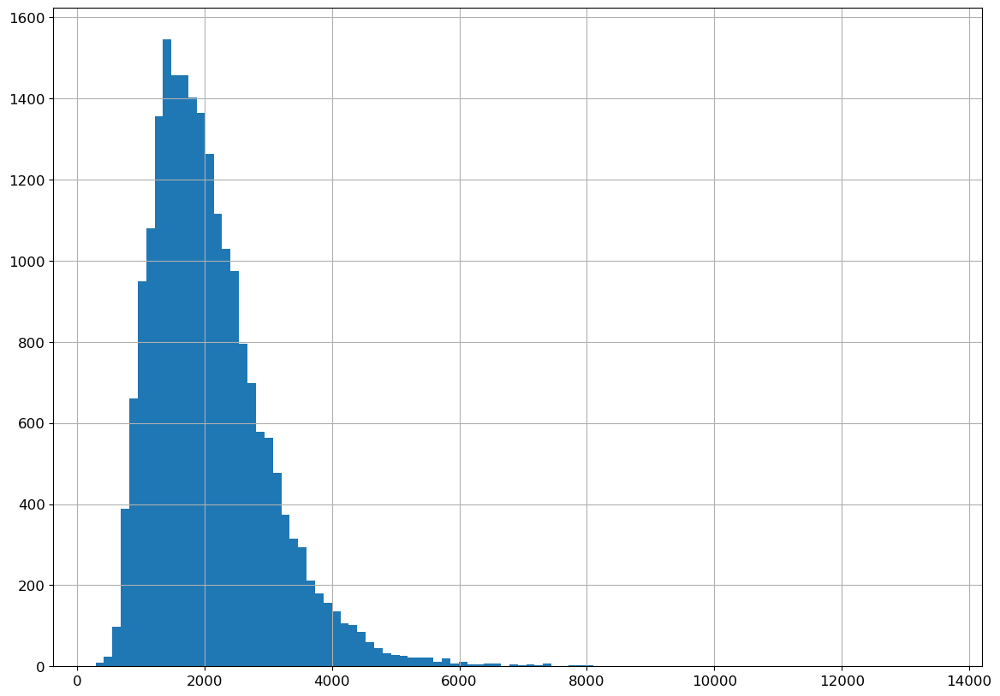

In [8]:
housing.sqft_living.hist(bins=100, figsize=(14,10))
plt.show()

A way to preserve the same proportion of samples with respect to `sqft_living` is to use a stratified split. We can split the dataset in such a way that the proportion of samples wrt `sqft_living` is preserved across the training and test set. To do this we first need to convert `sqft_living` into a categorical/ordinal variable.

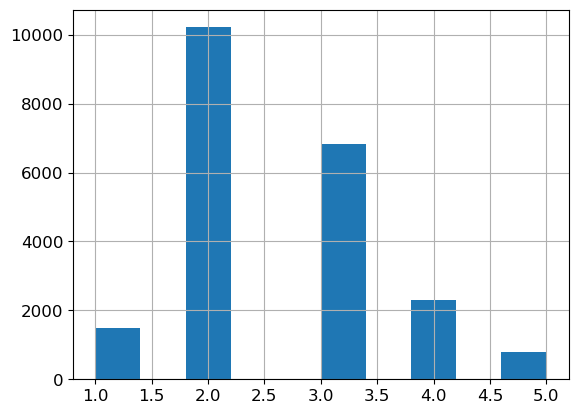

In [9]:
housing["sqft_living_cat"] = pd.cut(
    housing.sqft_living, 
    bins=[0., 1000., 2000., 3000., 4000., np.inf],
    labels=[1, 2, 3, 4, 5]
)
housing['sqft_living_cat'].hist()
plt.show()

In [10]:
housing['sqft_living_cat'].value_counts() / len(housing)

2   0.473
3   0.316
4   0.106
1   0.069
5   0.036
Name: sqft_living_cat, dtype: float64

Scikit-learn offers the class `StratifiedShuffleSplit` to perform stratified splits.

In [11]:
from sklearn.model_selection import StratifiedShuffleSplit
splitter = StratifiedShuffleSplit(n_splits=1, test_size=0.2, random_state=42)
for train_index, test_index in splitter.split(housing, housing.sqft_living_cat):
    train_set = housing.loc[train_index]
    test_set = housing.loc[test_index]

In [12]:
train_set.shape, test_set.shape

((17290, 22), (4323, 22))

We can verify that the proportion of samples wrt `sqft_living_cat` is preserved in training and test set:

In [13]:
train_set.sqft_living_cat.value_counts() / len(train_set)

2   0.473
3   0.316
4   0.106
1   0.069
5   0.036
Name: sqft_living_cat, dtype: float64

In [14]:
test_set.sqft_living_cat.value_counts() / len(test_set)

2   0.473
3   0.316
4   0.106
1   0.069
5   0.036
Name: sqft_living_cat, dtype: float64

We can now remove the `sqft_living_cat` feature as we will not need it again.

In [15]:
for set_ in (train_set, test_set):
    set_.drop("sqft_living_cat", axis=1, inplace=True)

## 3. Discover and Visualize the Data to Gain Insights

### 3.1 Outlier Detection

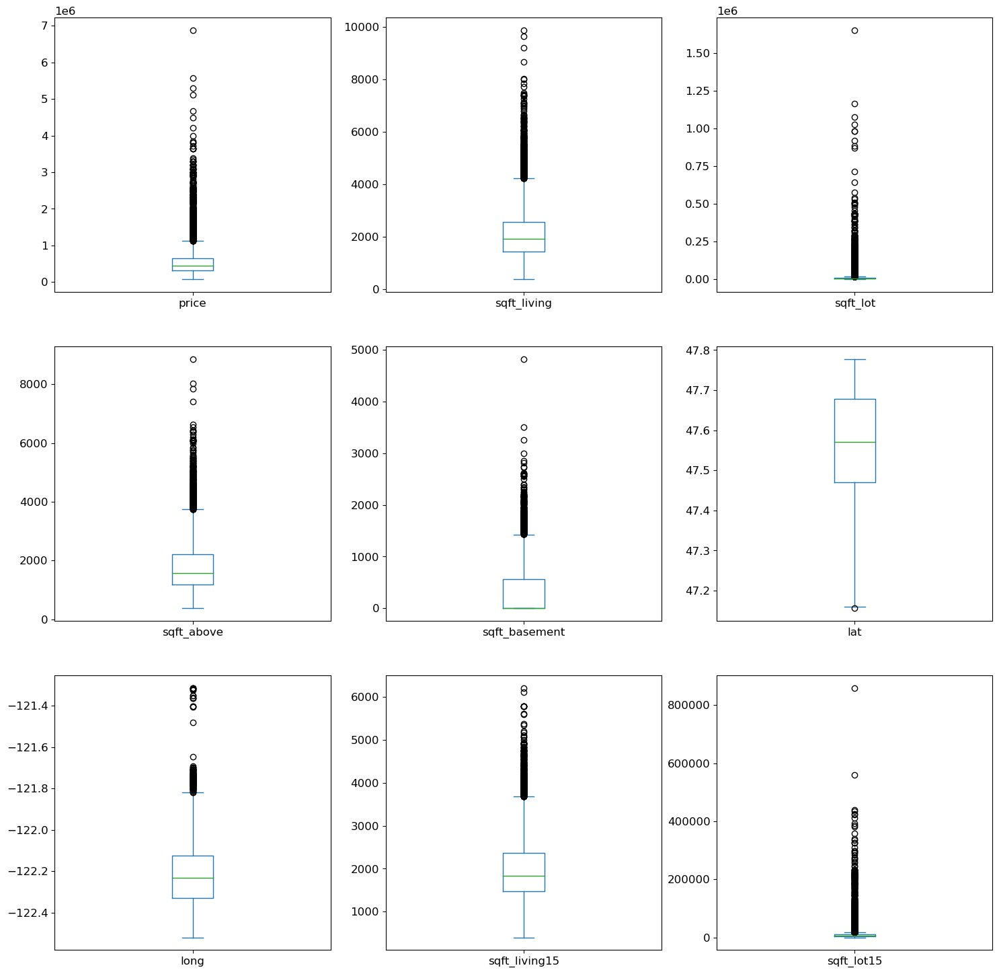

In [16]:
p = train_set[
    ['price', 'sqft_living', 'sqft_lot', 'sqft_above', 'sqft_basement', 
     'lat', 'long', 'sqft_living15', 'sqft_lot15']
].plot.box(subplots=True, layout=(3, 3), figsize=(18,18))

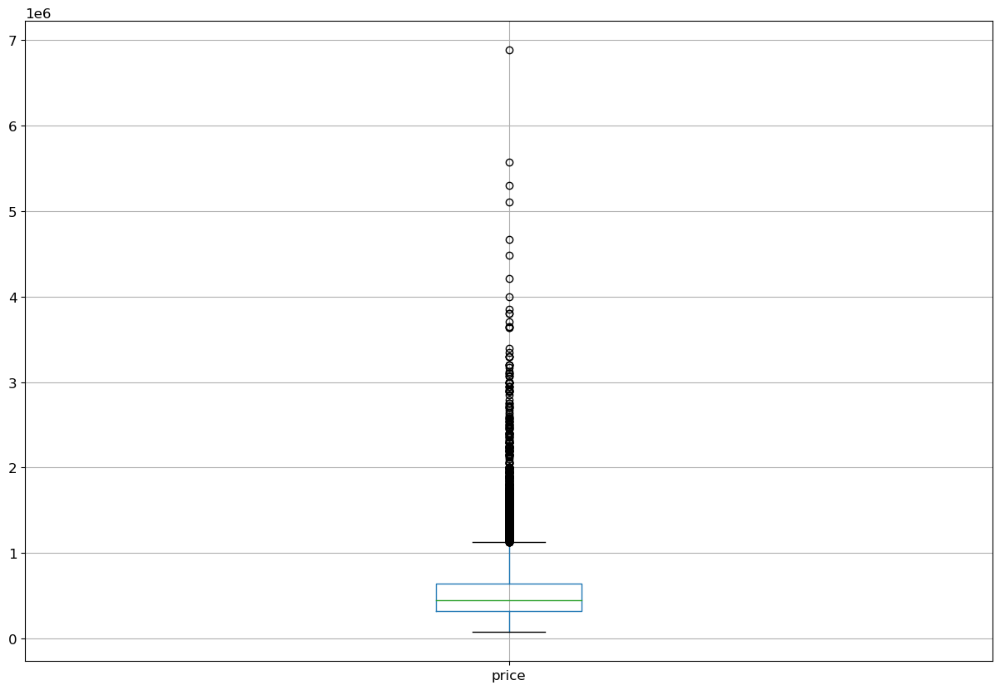

In [17]:
_ = train_set[['price']].boxplot(figsize=(15,10))

Box plot use the IQR method to display data and outliers(shape of the data) but in order to be get a list of identified outlier, we will need to use the mathematical formula and retrieve the outlier data.

Wikipedia Definition:
_The interquartile range (IQR), also called the midspread or middle 50%, or technically H-spread, is a measure of statistical dispersion, being equal to the difference between 75th and 25th percentiles, or between upper and lower quartiles, $IQR = Q_3 − Q_1$.

In other words, the IQR is the first quartile subtracted from the third quartile; these quartiles can be clearly seen on a box plot on the data.

It is a measure of the dispersion similar to standard deviation or variance, but is much more robust against outliers._

If a data point is below $Q_1 - 1.5\times IQR$ or above $Q_3 + 1.5\times IQR$ then it's an outlier.

![box-plot-summary](../p4ds/week2/box-plot-iqr.png)




## Exercise 1 
<b>Exercise 1:</b> Compute for me the count of outliers in our training set with respect to the `price` feature. (Hint: check the `DataFrame.quantile()` method and find a way to count the occurrences of values in a column of a DataFrame.) Additionally, write the code to remove those outliers. 

In [18]:
## Write you solution here. Add as many cells as you see fit
q1 = train_set.quantile(0.25, numeric_only=True)
q3 = train_set.quantile(0.75,  numeric_only=True)
iqr = q3 - q1
iqr

id              5188345868.750
price               322337.500
bedrooms                 1.000
bathrooms                0.750
sqft_living           1120.000
sqft_lot              5657.750
floors                   1.000
waterfront               0.000
view                     0.000
condition                1.000
grade                    1.000
sqft_above            1020.000
sqft_basement          570.000
yr_built                46.000
yr_renovated             0.000
lat                      0.208
long                     0.204
sqft_living15          880.000
sqft_lot15            5018.000
dtype: float64

In [19]:
outlier_crit_q1_price = train_set.price < (q1.price - 1.5 * iqr.price)
outlier_crit_q3_price = train_set.price > (q3.price + 1.5 * iqr.price)
outlier_crit = outlier_crit_q1_price | outlier_crit_q3_price
outlier_crit.value_counts()

False    16367
True       923
Name: price, dtype: int64

In [20]:
train_set[outlier_crit]

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
7426,2524000050,20141212T000000,1393000.000,3,3.500,4240,21578,2.000,0,0,...,10,3500,740,1994,0,98040,47.561,-122.215,3120,16440
11924,9831200520,20141006T000000,1443920.000,4,3.000,3720,5000,2.500,0,0,...,9,2720,1000,1905,0,98102,47.628,-122.322,2610,5000
16837,4441300170,20150112T000000,1300000.000,4,2.500,3110,11857,2.000,0,4,...,11,2040,1070,1990,0,98117,47.695,-122.402,3110,11570
1706,1336300445,20150422T000000,1265000.000,4,3.000,3130,2646,2.500,0,0,...,9,2290,840,1906,0,98102,47.627,-122.316,2920,4500
4335,4217401055,20140502T000000,1400000.000,4,2.500,2920,4000,1.500,0,0,...,8,1910,1010,1909,0,98105,47.658,-122.280,2470,4000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16352,3303980470,20141201T000000,1185000.000,4,3.250,3960,12895,2.000,0,0,...,11,3960,0,2001,0,98059,47.521,-122.151,3870,12040
20828,357000135,20150218T000000,1900000.000,4,2.500,3070,7830,2.000,0,2,...,11,1970,1100,2009,0,98144,47.593,-122.291,2440,4682
18202,3204300455,20140822T000000,1385000.000,3,2.250,2930,6000,2.000,0,2,...,11,1920,1010,2000,0,98112,47.630,-122.301,1870,5040
17596,1824079052,20150401T000000,1650000.000,4,3.250,4200,210394,2.000,0,0,...,10,4200,0,1993,0,98024,47.561,-121.961,2370,184694


Are the outliers legitimate or should we remove them?

### 3.2 Visualize geographical data

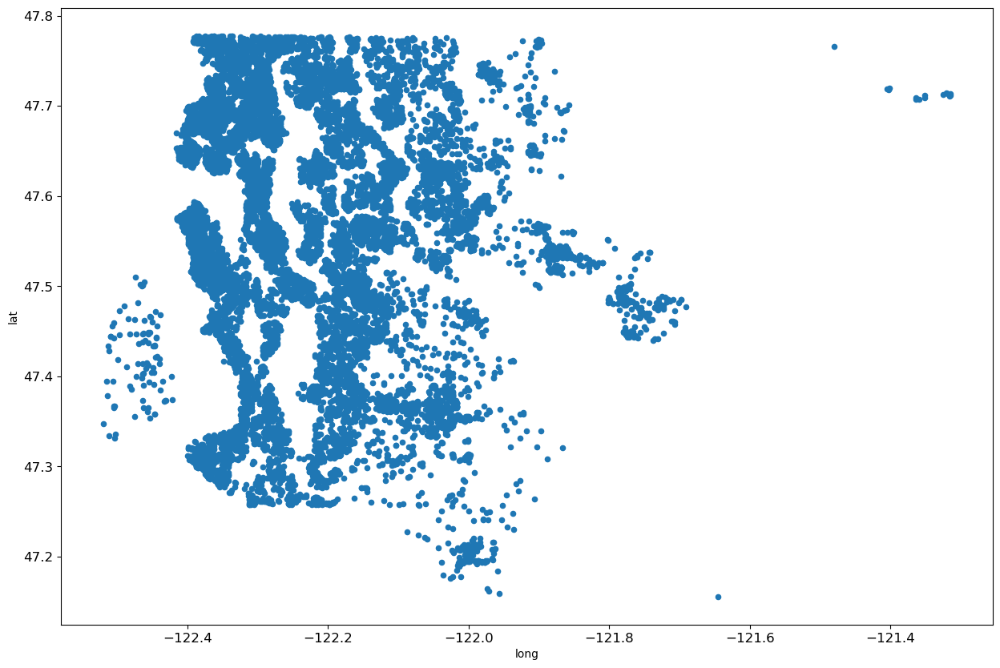

In [21]:
train_set.plot(
    kind="scatter", x="long", y="lat", figsize=(15,10)
)
plt.show()

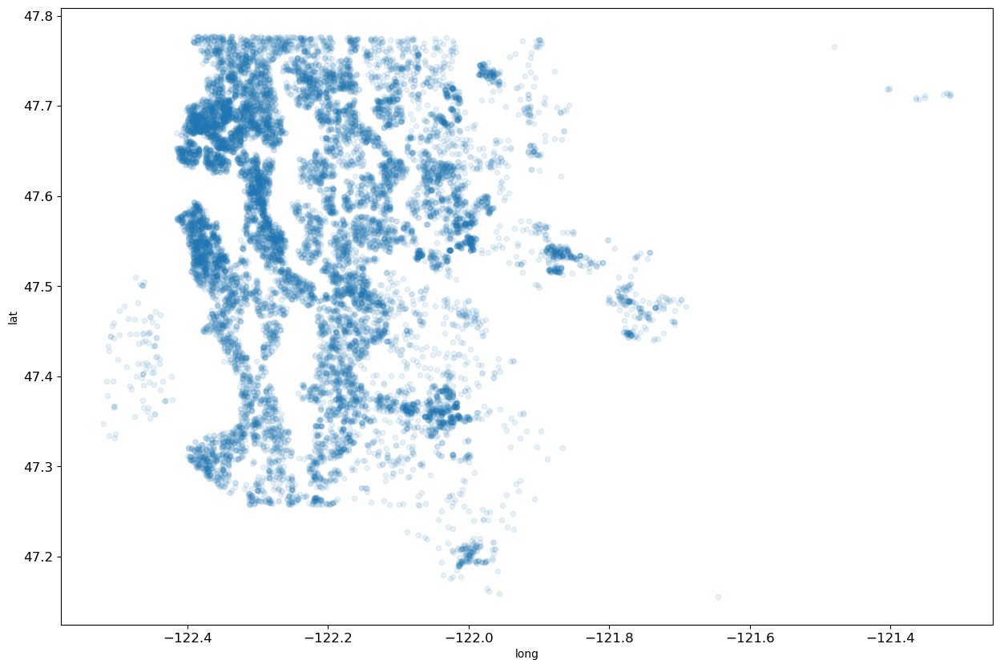

In [22]:
train_set.plot(kind="scatter", x="long", y="lat", alpha=0.1, figsize=(15,10))
plt.show()

We can add some info to the plot:
    * scale the size of the markers based on the surface areas of the house
    * colour-code the dots based on the house price

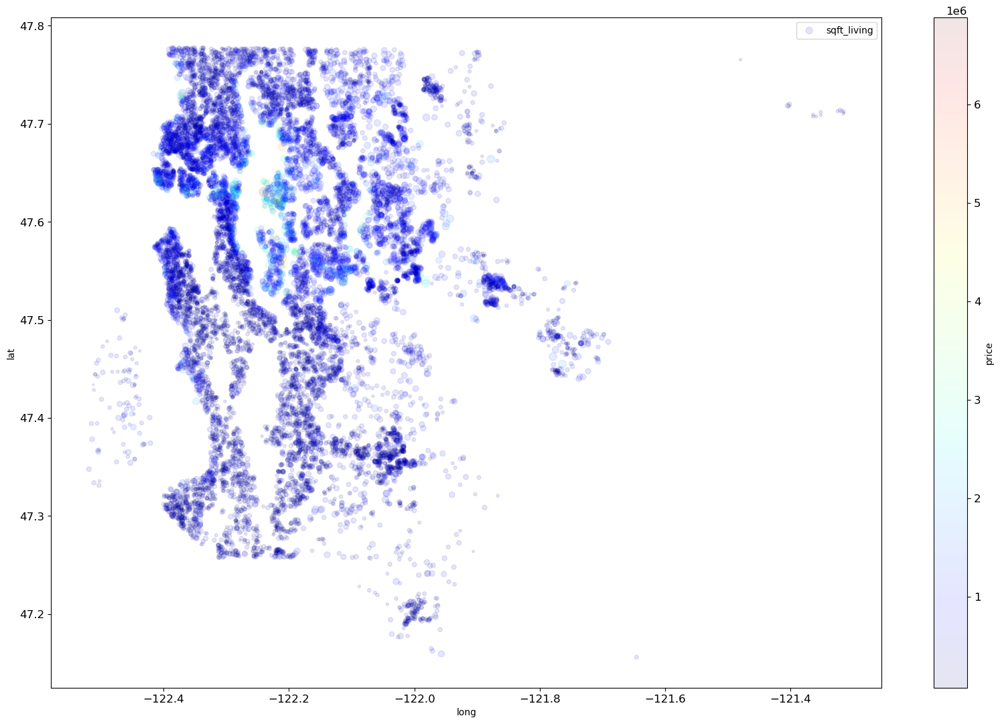

In [23]:
train_set.plot(
    kind="scatter",
    x="long",
    y="lat",
    alpha=0.1,
    figsize=(20,13),
    s=train_set["sqft_living"]/100,
    label="sqft_living",
    c="price",
    cmap=plt.get_cmap('jet'),
    colorbar=True
)
plt.legend()
plt.show()

Using the same colormap (i.e. jet), we can try to improve the visualization above, setting an upper value that is reasonable, (i.e less or equal to QR3 + 1.5 IQR such as 1,000,000 $), and not the highest value in the range.

We can create a custom discrete colorbar by using `matplotlib.colors.BoundaryNorm` as normalizer for your scatterplot. See the norm argument in `matplotlib.pyplot.scatter()`: https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.scatter.html


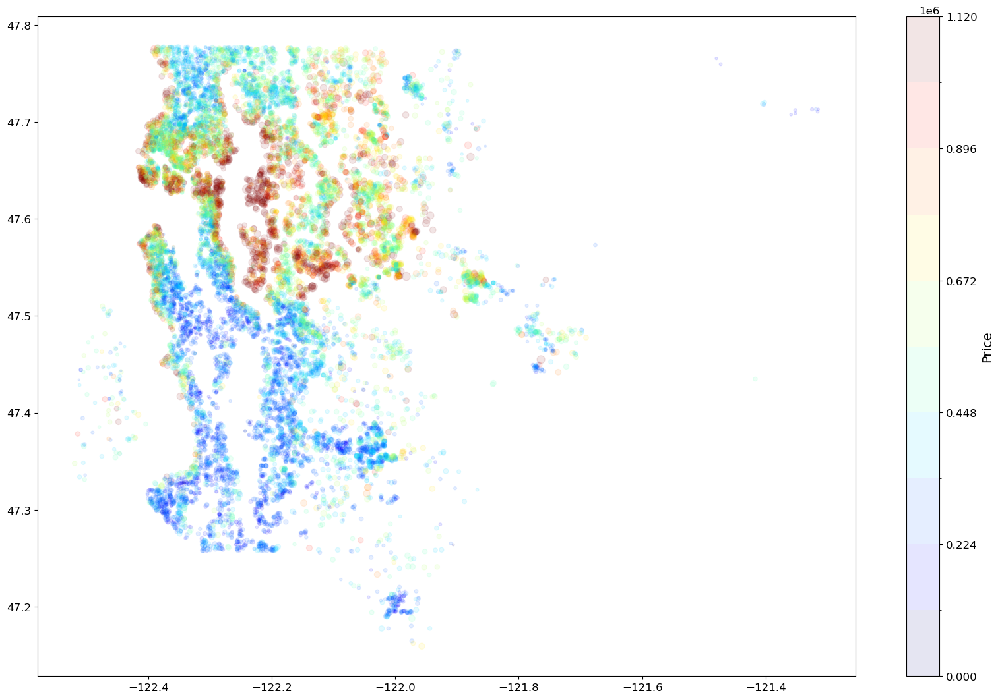

In [18]:
cmap = plt.cm.jet  # define the colormap
bounds = np.linspace(0, q3.price + 1.5 * iqr.price, 11) # define 11 evenly space

# The matplotlib.colors.BoundaryNorm class is used to create a colormap based on discrete numeric intervals.
norm = mpl.colors.BoundaryNorm(
    bounds, # Monotonically increasing sequence of boundaries
    cmap.N # Number of colors in the colormap to be used
)

plt.figure(figsize=(20, 13))
plt.scatter(
    x=train_set["long"],
    y=train_set["lat"],
    alpha=0.1,
    s=train_set["sqft_living"]/100, # size of the dot
    label=train_set["sqft_living"],
    c=train_set["price"], # colour of the dot
    cmap=cmap, # colour map 
    norm=norm # used to scale the color data, c, in the range 0 to 1, in order to map into the colormap cmap
)
plt.colorbar(label="Price", orientation="vertical")
plt.show()

An alternative way to achieve the same result as above is to use a `matplotlib.colors.LinearSegmentedColormap`:

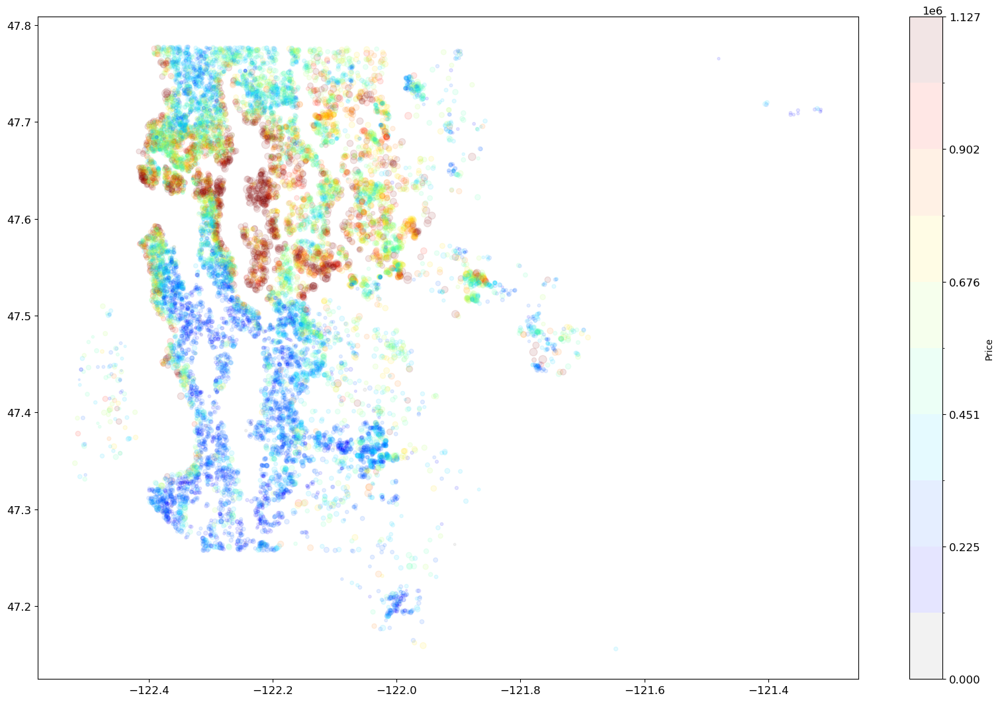

In [25]:
cmap = plt.cm.jet  # define the colormap
# extract all colors from the .jet map
cmaplist = [cmap(i) for i in range(cmap.N)]
# force the first color entry to be grey
cmaplist[0] = (.5, .5, .5, 1.0)

# create the new map
cmap = mpl.colors.LinearSegmentedColormap.from_list(
    'Custom cmap', cmaplist, cmap.N
)

# define the bins and normalize
bounds = np.linspace(0, q3.price + 1.5 * iqr.price, 11)
norm = mpl.colors.BoundaryNorm(bounds, cmap.N)
plt.figure(figsize=(20, 13))
plt.scatter(
    x=train_set["long"], y=train_set["lat"],
    alpha=0.1,
    s=train_set["sqft_living"]/100, label=train_set["sqft_living"],
    c=train_set["price"], cmap=cmap, norm=norm
)
plt.colorbar(label="Price", orientation="vertical")
plt.show()

## Question
**Question:** What insights can we infer from this graph?



<b> Answer: </b> From this map we can identify a cutoff at roughly latitude ~47.5 between more expensive houses and cheaper houses.We will create a binary engineered feature to capture this. We could also create a cutoff at -121.6 longitude to separate the urban west from the rural east of the county.

## Exercise 2
<b>Exercise 2:</b> explore on your own other ways to improve the graph above. You could look for ways to overlap it on top of the county map, or you could see if you can encode information differently.

Map support can be provided using either [Basemap](https://basemaptutorial.readthedocs.io/en/latest/) or [folium](https://python-visualization.github.io/folium/).
* To install basemap: `conda install -c conda-forge basemap basemap-data-hires`
* To install folium: `conda install -c conda-forge folium`

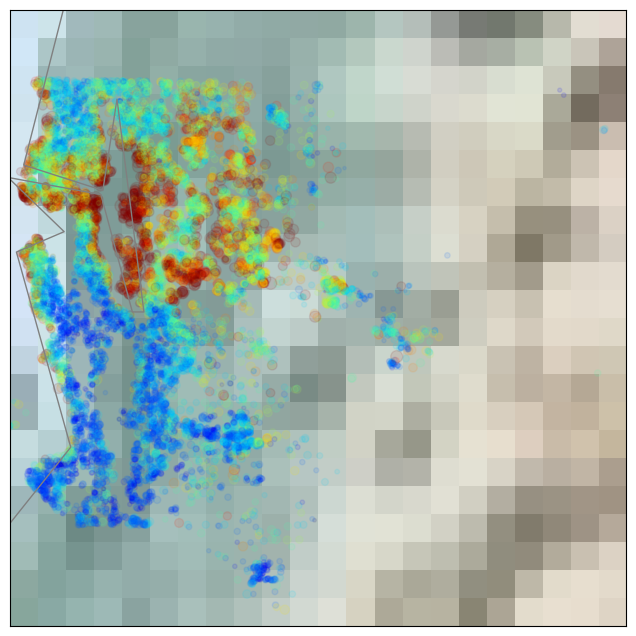

In [19]:
### Write here your possible solution
### To install basemap run: conda install -c conda-forge basemap basemap-data-hires
q1 = train_set.quantile(0.25, numeric_only=True)
q3 = train_set.quantile(0.75,  numeric_only=True)
iqr = q3 - q1
iqr
from mpl_toolkits.basemap import Basemap
### From last cell
cmap = plt.cm.jet  # define the colormap
bounds = np.linspace(0, q3.price + 1.5 * iqr.price, 11) # define 11 evenly space

# The matplotlib.colors.BoundaryNorm class is used to create a colormap based on discrete numeric intervals.
norm = mpl.colors.BoundaryNorm(
    bounds, # Monotonically increasing sequence of boundaries
    cmap.N # Number of colors in the colormap to be used
)


#####
fig = plt.figure(figsize=(8, 8))
m = Basemap(
    projection='lcc',
    resolution='l',  # ideally this should work with resolution set to "h" or "f"
    lat_0=47.5,
    lon_0=-121.9,
    width=8e4,
    height=8e4
)
m.shadedrelief()
m.drawcoastlines(color='gray')
m.drawcountries(color='gray')
m.drawstates(color='gray')

_ = m.scatter(
    train_set["long"],
    train_set["lat"],
    latlon=True,
    alpha=0.1,
    s=train_set["sqft_living"]/100, # size of the dot
    label=train_set["sqft_living"],
    c=train_set["price"], # colour of the dot
    cmap=cmap, # colour map 
    norm=norm # used to scale the color data, c, in the range 0 to 1, in order to map into the colormap cmap
)

In [22]:
import branca.colormap as cm
import folium


cmap = plt.cm.jet  # define the colormap
# extract all colors from the .jet map
cmaplist = [cmap(i) for i in range(cmap.N)]

# create a colormap that folium can use
color_map = cm.LinearColormap(
    colors=cmaplist,                  # list of colors
    vmin=0,                           # lower bound
    vmax=q3.price + 1.5 * iqr.price   # upper bound
)
    

 # Initialize Folium Map with Seattle latitude and longitude
m = folium.Map(
    location=[47.35, -121.9],  # centre of the map
    zoom_start=9,              # initial zoom level
    detect_retina=True,
    control_scale=False
)

for ix, house in train_set.iterrows():
    folium.Circle(
        location=[house['lat'], house['long']],
        radius=10,
        fill=True,
        color=color_map(house["price"]),
        fill_opacity=0.2
    ).add_to(m)

m

### 3.2 Numerical features: looking for correlations

The dataset is not that big, and we can compute the standard correlation coefficient (Pearson’s r coefficient) between every two features using the `DataFrame.corr()` method:

In [7]:
corr_matrix = train_set.corr(numeric_only=True)
corr_matrix["price"].sort_values(ascending=False)

price            1.000
sqft_living      0.702
grade            0.665
sqft_above       0.603
sqft_living15    0.583
bathrooms        0.527
view             0.392
sqft_basement    0.321
lat              0.311
bedrooms         0.308
floors           0.253
waterfront       0.253
yr_renovated     0.128
sqft_lot         0.091
sqft_lot15       0.079
yr_built         0.049
condition        0.036
long             0.023
id              -0.021
Name: price, dtype: float64

N.B. The correlation coefficient only measures linear correlations, and it may completely miss nonlinear correlation factors. 

Another way to check for correlation visually is to use the `scatter_matrix()` utility function offered by Pandas, which leverages `matplotlib`, or seaborn's `pairplot()` function.

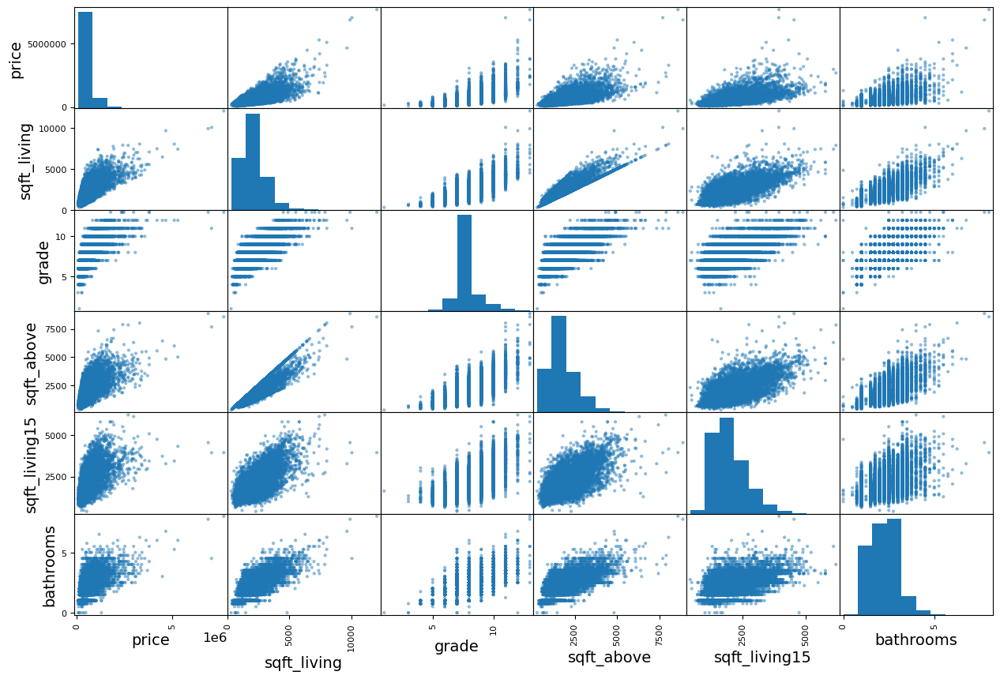

In [8]:
attributes = [
    "price", "sqft_living", "grade",
    "sqft_above", "sqft_living15", "bathrooms"
]
pd.plotting.scatter_matrix(
    train_set[attributes], figsize=(15, 10)
)
plt.show()

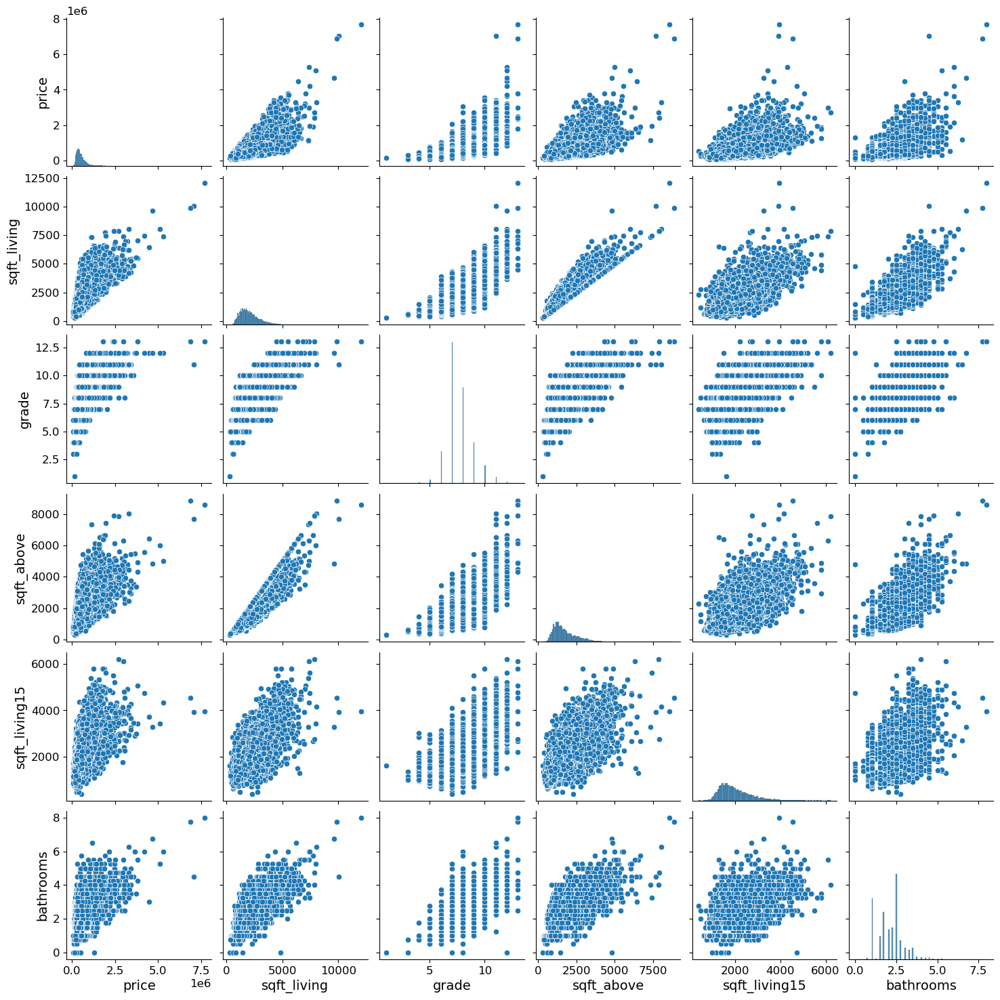

In [9]:
ax = sns.pairplot(train_set[attributes])

### 3.2 Numerical features: checking for multicolinearity

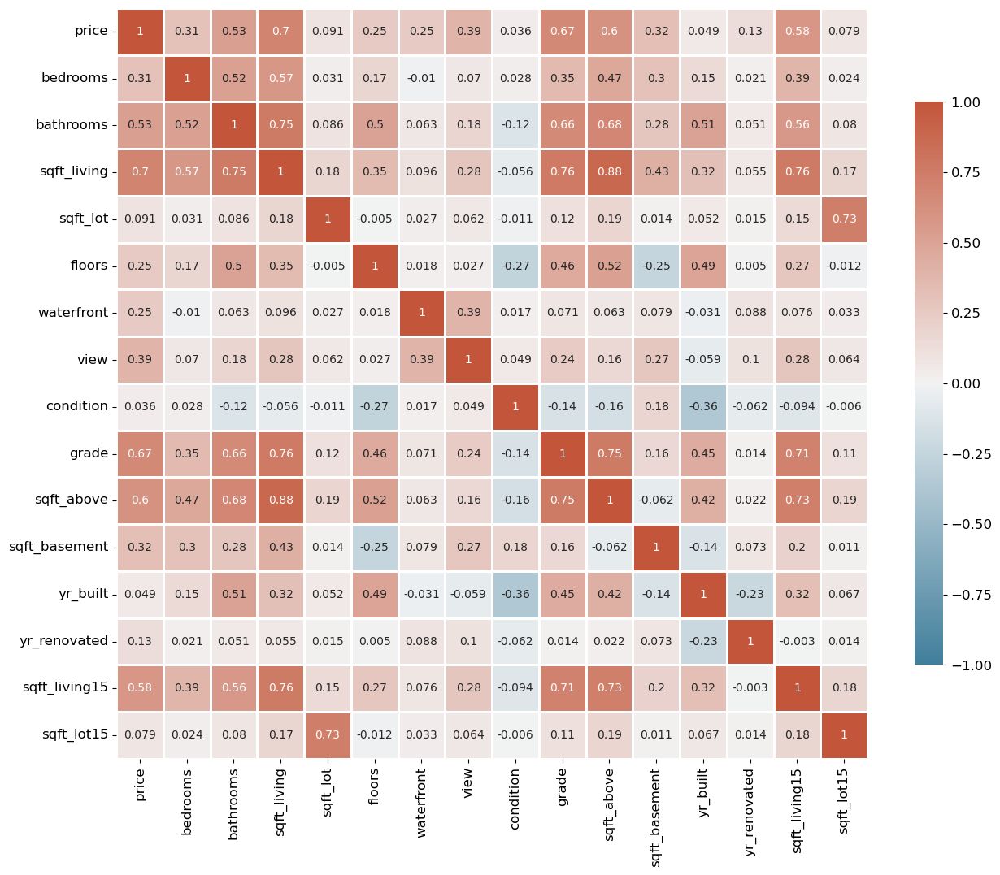

In [10]:
# generate copy of df without target variable (price), id, date and lat/lon to perform multicolinearity check
train_set_pred = train_set.drop(["id", "date", "lat", "long"], axis=1)

# check for multicolinearity with seaborn heatmap
# compute the correlation matrix
corr = round(train_set_pred.corr(numeric_only=True), 3)

# set up the matplotlib figure
fig, ax = plt.subplots(figsize=(15, 12))

# generate a custom diverging colormap
cmap = sns.diverging_palette(230, 20, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
ax = sns.heatmap(corr, cmap=cmap, vmax=1, vmin=-1, center=0, square=True, linewidths=1, cbar_kws={"shrink": .75}, annot=True)

plt.show()

As the correlation matrix is simmetrical we can get rid of the upper triangle using a triangular boolean mask: 

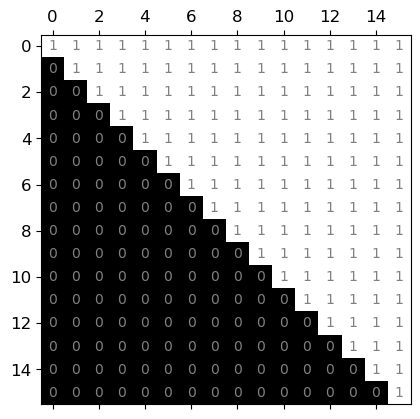

In [12]:
# generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=bool))

# Let's visualise the mask with matplotlib
fig, ax = plt.subplots()

ax.matshow(mask, cmap="gray")

for (i, j), z in np.ndenumerate(mask):
    ax.text(j, i, '{:0.0f}'.format(z), ha='center', va='center', c="gray")

plt.show()

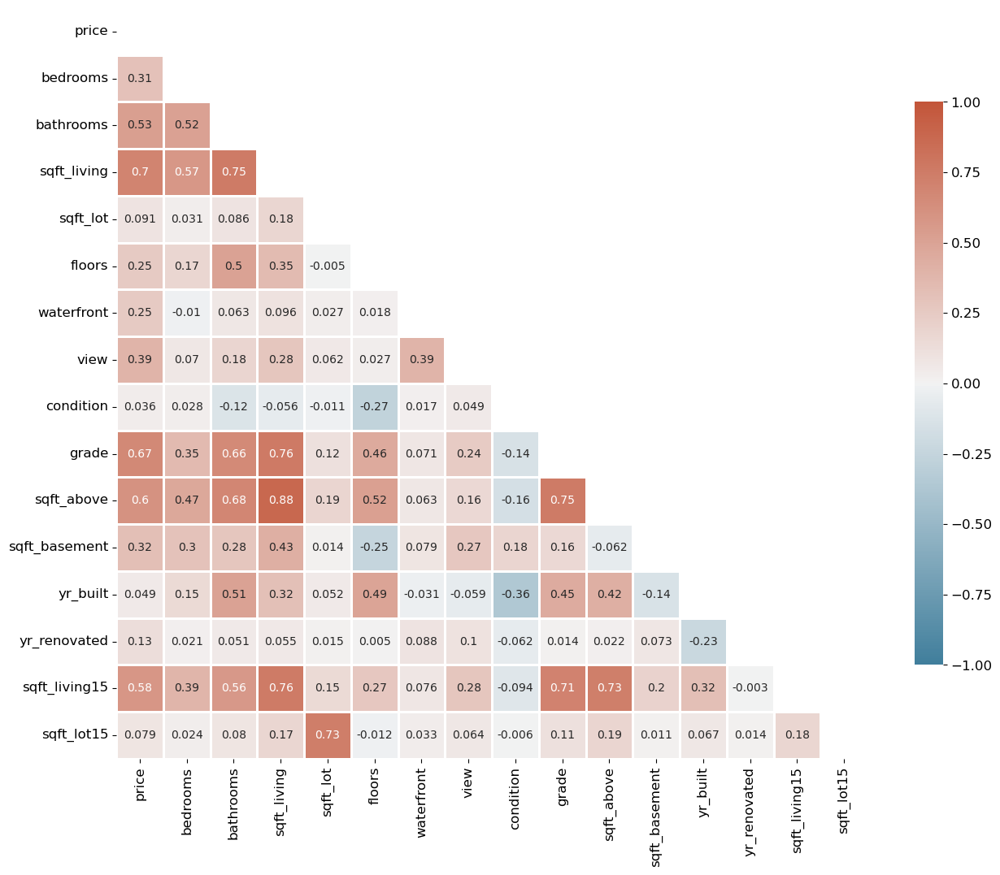

In [13]:
# set up the matplotlib figure
fig, ax = plt.subplots(figsize=(15, 12))

# Draw the heatmap with the mask and correct aspect ratio
ax = sns.heatmap(corr, mask=mask, cmap=cmap, vmax=1, vmin=-1, center=0, square=True, linewidths=1, cbar_kws={"shrink": .75}, annot=True)

plt.show()

## Question 
**Question:** what conclusions can we draw from this correlation matrix? Is there any redundant information in the dataset?


<b> Answer: </b> We can now draw some conclusions. If we use 0.75 as a cutoff, we can clearly see that there is high correlation between `sqft_living`, `sqft_living15` and `sqft_above`. For training our models we should probably only retain one of these, ideally `sqdt_living` as it is the one that correlates more with the target variable `price`.

NB: `grade` is on this high correlation list as well if we consider it as numerical, but would probably make more sense to consider it as an ordinal variable.

### 3.3 Preparing numerical data for training:

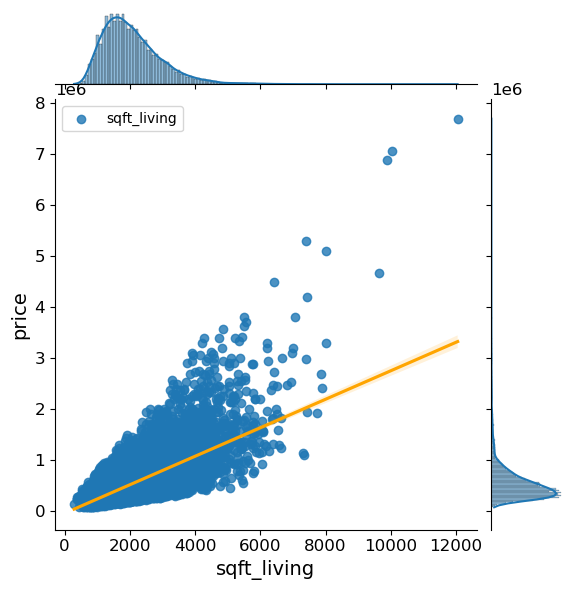

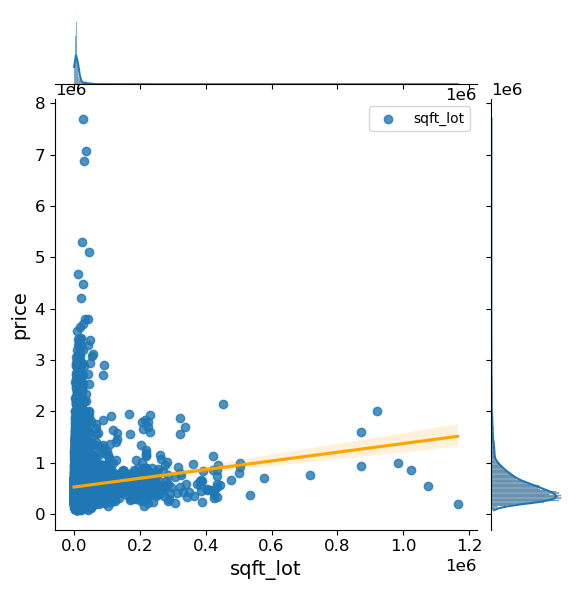

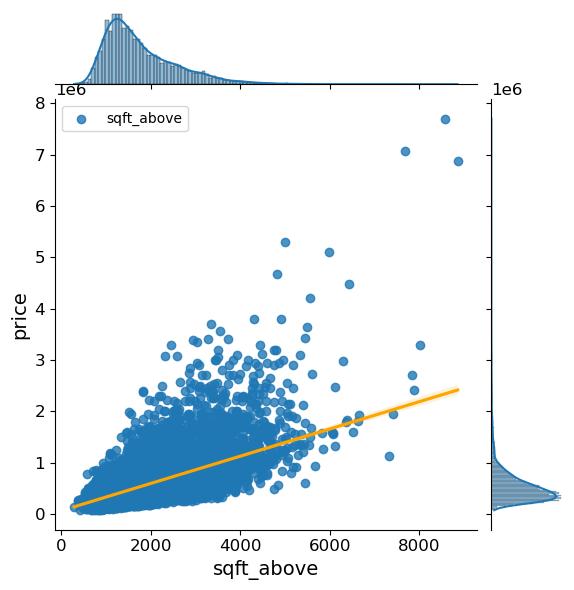

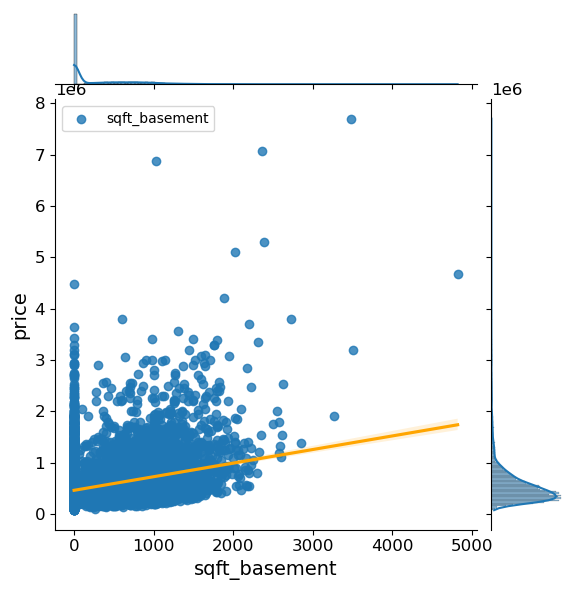

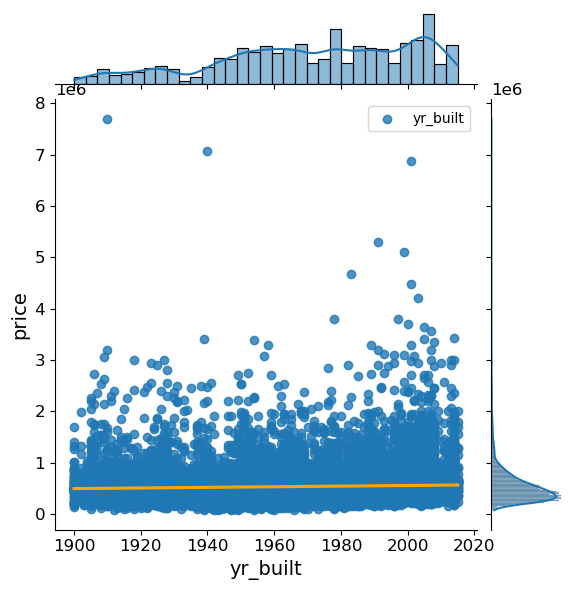

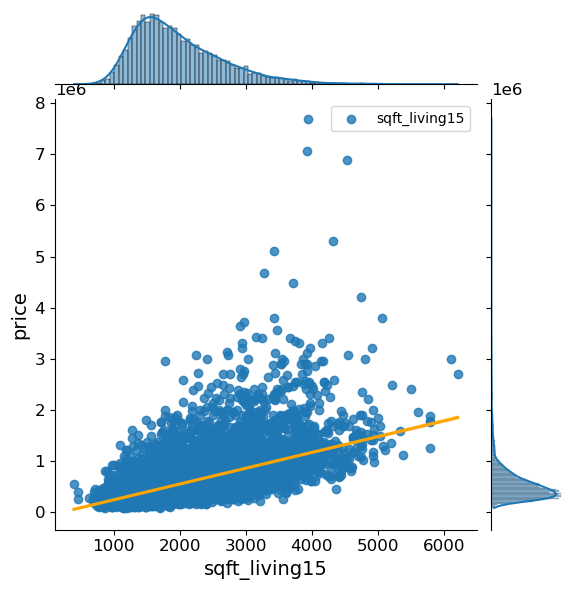

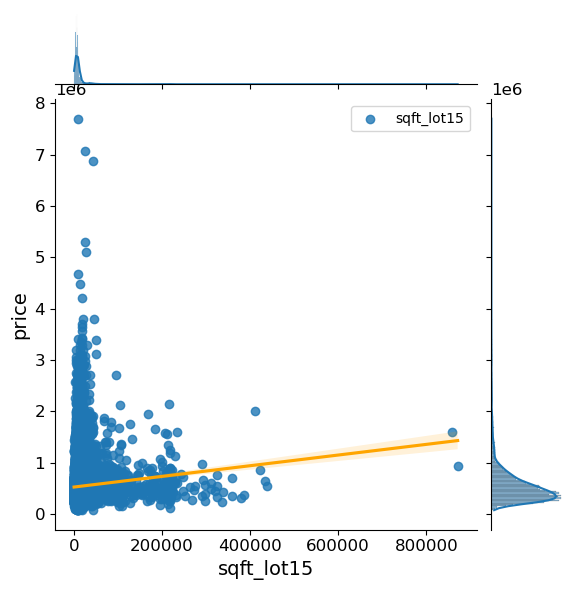

In [14]:
numerical_features = ['sqft_living','sqft_lot','sqft_above','sqft_basement','yr_built','sqft_living15','sqft_lot15']

for feat in numerical_features:
    sns.jointplot(
        x=feat,
        y="price",
        data=train_set,
        kind='reg',
        label=feat,
        joint_kws={'line_kws':{'color':'orange'}}
    )
    plt.legend()
    plt.show()

As we have already seen in the multicolinearity test `sqft_living`, `sqft_living15`, and `sqft_above` predictors all seem to have prominent linear correlation with price, Of the three, we will use `sqft_living` as it is the one that mostly correlates with price. 

We can notice that there are a bunch of zeros in `sqft_basement`. That indicates that those homes do not have basements.To tackle that, we will create a binary feature that indicates whethere a house has a basement or not.

Finally, `yr_built` does not seem to show any clear relationship with price. We could combine the information of `yr_built` with `yr_renovated` to see get a more useful information. We will create a `renovated` binary flag. If a house is older than 25 years (relative to the most recent data in the dataset) and has not been renovated we will set `renovated` to 0, otherwise to 1.

### 3.4 Categorical and Ordinal Features

Let's examine the categorical and ordinal features more closely. Boxplots and violin plots are the most suited type of graphs for plotting a categorical variable against a numerical one (i.e. our target variable `price`)

First we need to convert these columns to the category type:

In [45]:
categorical_features = ['bedrooms','bathrooms','floors','waterfront','view','condition','grade','zipcode']
train_set[categorical_features] = train_set[categorical_features].astype('category')
train_set.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 17290 entries, 6325 to 15795
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype   
---  ------         --------------  -----   
 0   id             17290 non-null  int64   
 1   date           17290 non-null  object  
 2   price          17290 non-null  float64 
 3   bedrooms       17290 non-null  category
 4   bathrooms      17290 non-null  category
 5   sqft_living    17290 non-null  int64   
 6   sqft_lot       17290 non-null  int64   
 7   floors         17290 non-null  category
 8   waterfront     17290 non-null  category
 9   view           17290 non-null  category
 10  condition      17290 non-null  category
 11  grade          17290 non-null  category
 12  sqft_above     17290 non-null  int64   
 13  sqft_basement  17290 non-null  int64   
 14  yr_built       17290 non-null  int64   
 15  yr_renovated   17290 non-null  int64   
 16  zipcode        17290 non-null  category
 17  lat            17290 non-nul

We can then start using boxplots or violinplots to further investigate targeted correlations, such as 'grade' vs 'price' or 'floors' vs 'price'.

## Exercise 3

<b>Exercise 3:</b> write a function that takes a categorical or ordinal feature as a first argument, the size of a figure as a second argument and plots, using seaborn, a set of boxplots of the price distribution for each category in the input categorical feature.

In [30]:
def print_boxplot(
    data_set: pd.DataFrame,
    feature: str, 
    figsize: tuple[int, int] = (14, 6), 
    xlabels_rotation: int = None
):
    """
    data_set: the dataset as a Data Frame
    feature: the name of the feature to plot against "price"
    figsize: the (width, height) size of the figure
    xlabels_rotation: the rotation of the X labels. Default is equivalent to no rotation
    """
    # create a dataframe containing only feature and "price"
    data = pd.concat(
        [data_set['price'], data_set[feature]],
        axis=1
    )
    # specify the size of the figure
    plt.subplots(figsize=figsize)
    # create the feature vs price boxplot using seaborn
    chart = sns.boxplot(x=feature, y="price", data=data)
    # specify as max for the "price" axis to 5 million $
    chart.axis(ymin=0, ymax=7_000_000)
    # if an x-label rotation is provided, rotate the x label of the chart
    if xlabels_rotation is not None:
        chart.set_xticklabels(chart.get_xticklabels(), rotation=xlabels_rotation, horizontalalignment='center')

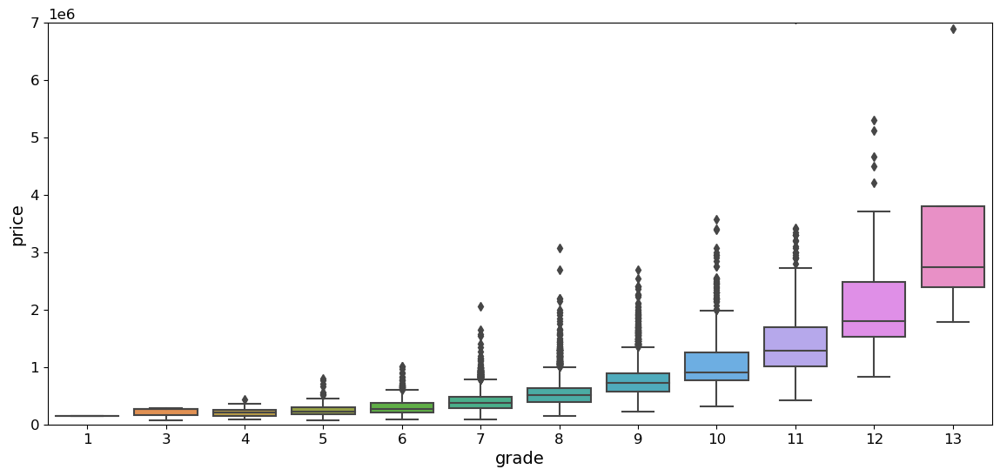

In [31]:
## Try your function to plot 'grade' vs 'price'.
## If you have implemented it correctly it will plot out the boxplots
print_boxplot(train_set, 'grade')

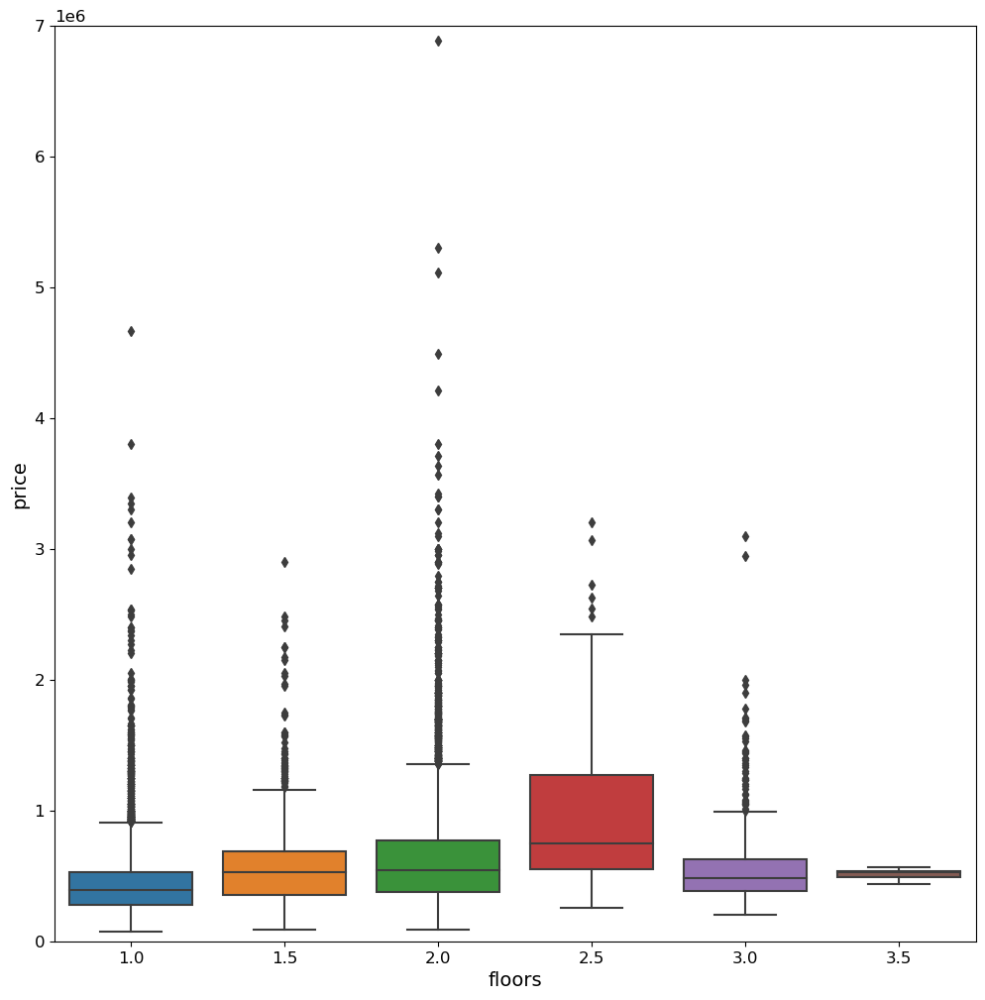

In [32]:
## Try your function to plot 'floors' vs 'price'.
## If you have implemented it correctly it will plot out the boxplots
print_boxplot(train_set, 'floors', figsize=(12, 12))

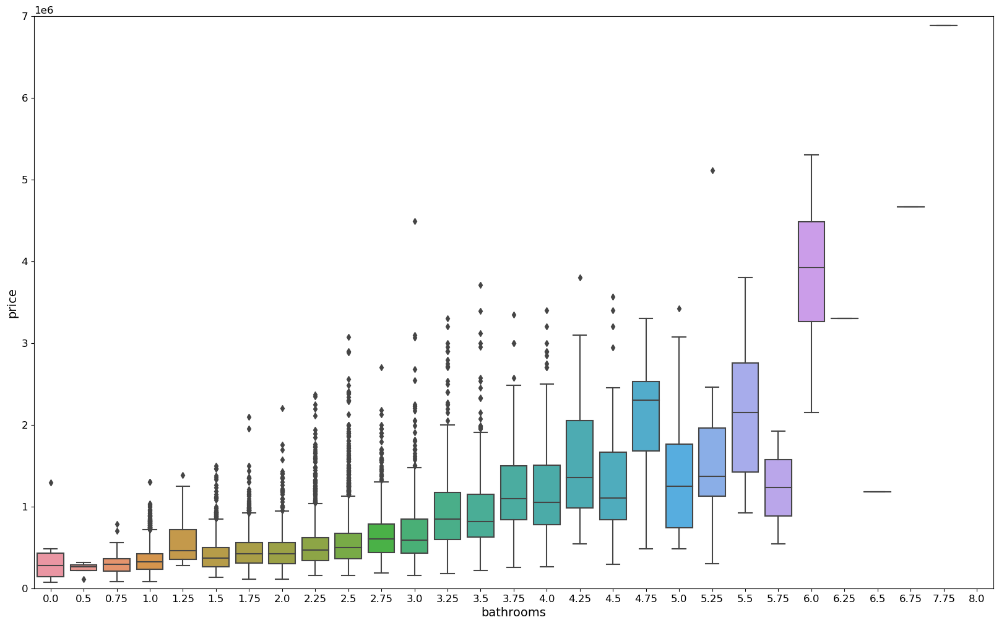

In [33]:
## Try your function to plot 'bathrooms' vs 'price'.
## If you have implemented it correctly it will plot out the boxplots
print_boxplot(train_set, 'bathrooms', figsize=(20, 12))

## Question 
**Question:** Do you notice anything suspicious with bathrooms?

<b> Answer: </b> Quite a few houses seem to report 0 bathrooms. This must be a mistake so we will have to replace those values with more meaningful ones.

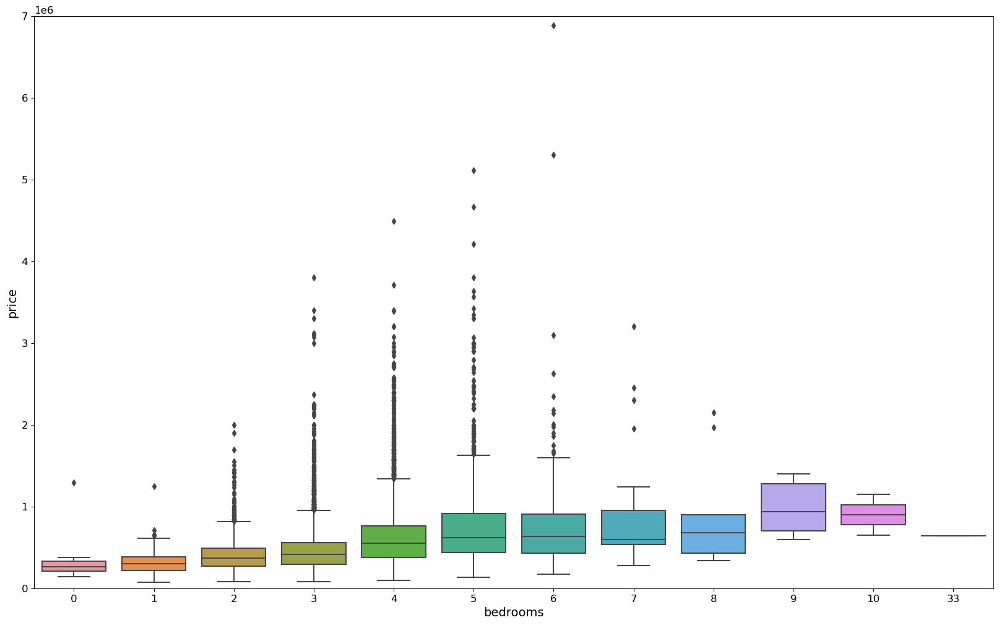

In [34]:
print_boxplot(train_set, 'bedrooms', figsize=(20, 12))

## Question 
**Question:** Do you notice anything suspicious with bedrooms?

<b> Answer: </b> Some houses report 0 bedroom. Those are probably studio apartments so they are legitimate (their price mostly is at the bottom end). However there is a house with
33 bedrooms. That is most likely a mistake in reporting a 3-bedroom house, looking at the price. 


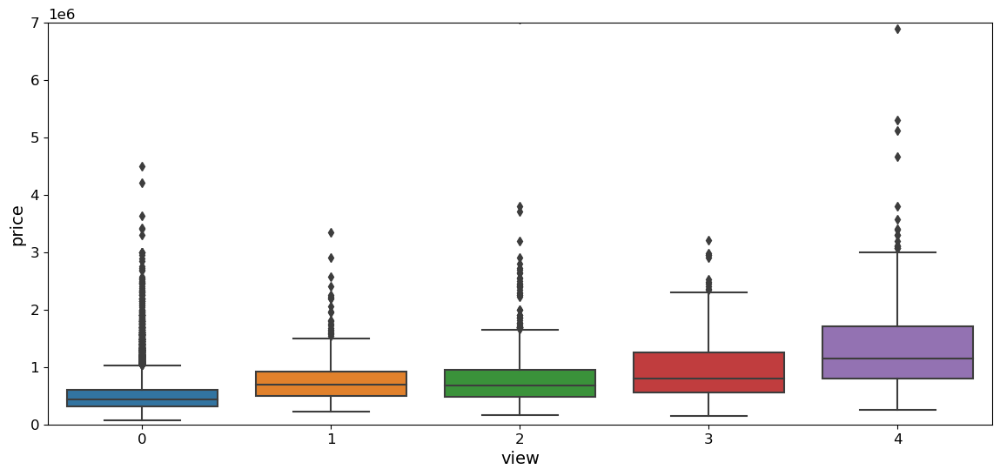

In [35]:
print_boxplot(train_set, "view")

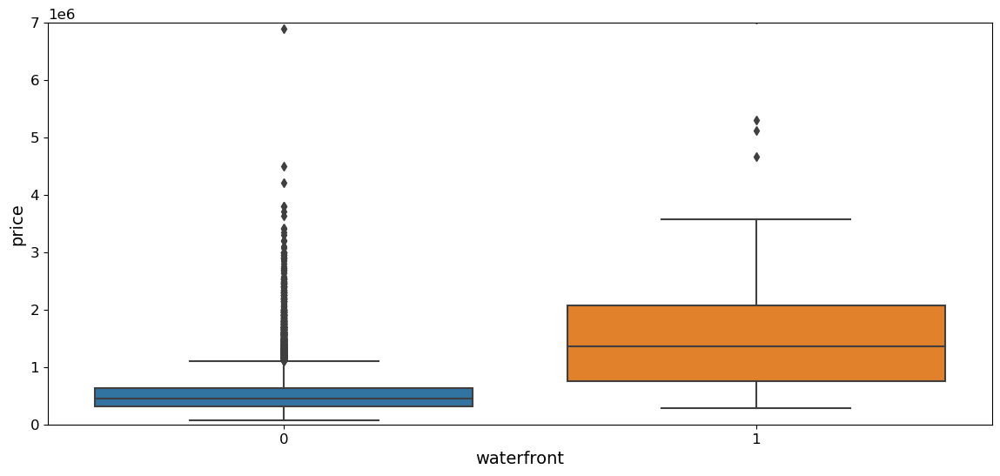

In [36]:
print_boxplot(train_set, "waterfront")

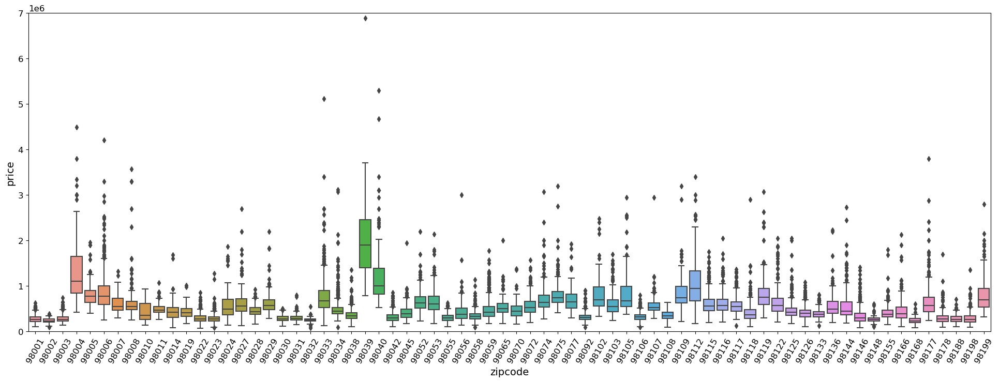

In [46]:
print_boxplot(train_set, "zipcode", figsize=(24, 8), xlabels_rotation= 60)

### 3.4 Categorical variables: statistical test to evaluate significance (optional)

#### ANOVA test for the "view" feature

Analysis of Variance (ANOVA) is a statistical test that analyses the difference among means. ANOVA checks if the means of two or more groups are significantly different from each other. In our case we want to see if the average prices are significantly different among the 5 view categories.

We can compute ANOVA using the `statsmodels` library.

In [40]:
lin_mod = ols("price ~ view", train_set).fit()
table = sm.stats.anova_lm(lin_mod, typ=2)
print(table)

                       sum_sq        df       F  PR(>F)
view      364003079720889.000     4.000 830.091   0.000
Residual 1894911452057237.000 17285.000     NaN     NaN


As the p-value for view is 0.000 < 0.05, the difference of average house prices among the view categories is significant.

#### Post-hoc test

We can run a post-hoc test to make pairwise comparisons and see which pairs of view categories have significant mean differences:

In [47]:
pair_t = lin_mod.t_test_pairwise("view")
pair_t.result_frame

,coef,std err,t,P>|t|,Conf. Int. Low,Conf. Int. Upp.,pvalue-hs,reject-hs
1-0,303509.396,20141.479,15.069,0.000,264030.058,342988.735,0.000,True
2-0,304174.484,12126.141,25.084,0.000,280406.019,327942.948,0.000,True
3-0,479299.443,16848.467,28.448,0.000,446274.741,512324.145,0.000,True
4-0,909559.547,21107.907,43.091,0.000,868185.912,950933.182,0.000,True
2-1,665.087,23208.944,0.029,0.977,-44826.792,46156.966,0.977,False
3-1,175790.047,25990.048,6.764,0.000,124846.921,226733.173,0.000,True
4-1,606050.151,28933.640,20.946,0.000,549337.288,662763.014,0.000,True
3-2,175124.960,20416.825,8.577,0.000,135105.916,215144.003,0.000,True
4-2,605385.064,24052.435,25.169,0.000,558239.857,652530.271,0.000,True
4-3,430260.104,26745.975,16.087,0.000,377835.286,482684.922,0.000,True


All the differences are significant except between view 1 and view 2. This could already be discerned from the boxplot graph. We could then rework the view categories merging together views 1 and 2 and reducing the 5 categories to 4.

Another option would be convert this feature to a binary one ("view" vs "no view"). For our model training we will keep all the view levels and treat it as an ordinal variable.

### ANOVA and post-hoc tests on ZIPCODE

We could do a symilar analysis on the `zipcode` field to reduce the number of categories there.

In [48]:
zipcodes = train_set["zipcode"].unique()
zipcodes

['98042', '98118', '98146', '98031', '98034', ..., '98039', '98024', '98007', '98019', '98014']
Length: 70
Categories (70, object): ['98001', '98002', '98003', '98004', ..., '98178', '98188', '98198', '98199']

We have 70 zipcodes. That is a bit too many categories given the number of samples we have. A plurality of these zipcodes likely have very few samples so we may encur into overfitting our models. We could find a way to cluster/collapse these zipcodes together, based on whether
their average house price is significantly different or not.
To do this we can first do an ANOVA test on `zipcode` and their peform pairwise post-hoc t-test and then collapse together those zipcodes whose t-test indicates that the means are not significantly different.

In [49]:
lin_mod = ols("price ~ zipcode", train_set).fit()
table = sm.stats.anova_lm(lin_mod, typ=2)
print(table)

                       sum_sq        df       F  PR(>F)
zipcode   930598950310120.875    69.000 174.842   0.000
Residual 1328315581468005.000 17220.000     NaN     NaN


As the p-value for view is 0.000 < 0.05, the difference of average house prices among the view categories is significant.

#### Post-hoc test

In [50]:
pair_t = lin_mod.t_test_pairwise("zipcode")
pair_t.result_frame

,coef,std err,t,P>|t|,Conf. Int. Low,Conf. Int. Upp.,pvalue-hs,reject-hs
98002-98001,-42976.636,27351.511,-1.571,0.116,-96588.382,10635.109,1.000,False
98003-98001,8786.386,24864.051,0.353,0.724,-39949.685,57522.457,1.000,False
98004-98001,1043608.390,24100.659,43.302,0.000,996368.647,1090848.133,0.000,True
98005-98001,529252.080,29161.128,18.149,0.000,472093.301,586410.858,0.000,True
98006-98001,601124.277,21454.489,28.019,0.000,559071.295,643177.259,0.000,True
...,...,...,...,...,...,...,...,...
98198-98178,-8830.844,26641.479,-0.331,0.740,-61050.853,43389.165,1.000,False
98199-98178,470876.857,25954.754,18.142,0.000,420002.898,521750.816,0.000,True
98198-98188,19714.014,32662.296,0.604,0.546,-44307.410,83735.438,1.000,False
98199-98188,499421.715,32104.617,15.556,0.000,436493.398,562350.031,0.000,True


280484.6551724138
289271.0410958904
237508.01875
-24.437649466013692
4.821854869663567e-89
18.222522372049916 is the test and the its pvalue 1.9724440638984705e-08


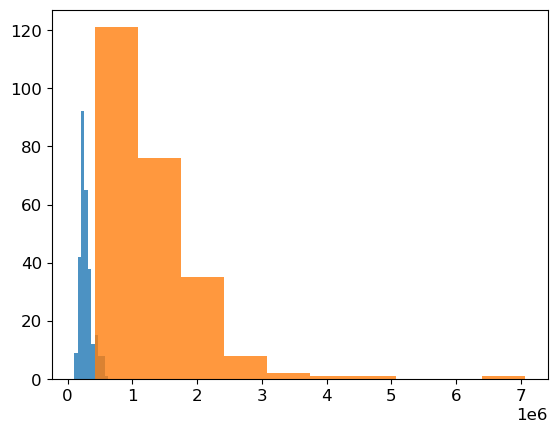

In [85]:
from scipy.stats import ttest_ind
import numpy
print(np.mean(train_set.price[train_set.zipcode=="98001"]))
print(np.mean(train_set.price[train_set.zipcode=="98003"]))
print(np.mean(train_set.price[train_set.zipcode=="98002"]))

plt.hist(train_set.price[train_set.zipcode=="98001"], alpha=.8)
plt.hist(train_set.price[train_set.zipcode=="98004"], alpha=.8)


Let's now extract the zipcode pairs whose post-hoc t-test fails to reject the null hypothesis (i.e. the average prices are not significantly different)

In [55]:
ttests_frame = pair_t.result_frame[pair_t.result_frame["reject-hs"].isin([False])].reset_index(names="zipcode-pairs")

In [56]:
ttests_frame["zipcode-pairs"] = ttests_frame["zipcode-pairs"].str.split("-")

In [57]:
ttests_frame

,zipcode-pairs,coef,std err,t,P>|t|,Conf. Int. Low,Conf. Int. Upp.,pvalue-hs,reject-hs
0,"[98002, 98001]",-42976.636,27351.511,-1.571,0.116,-96588.382,10635.109,1.000,False
1,"[98003, 98001]",8786.386,24864.051,0.353,0.724,-39949.685,57522.457,1.000,False
2,"[98022, 98001]",29644.366,26090.480,1.136,0.256,-21495.629,80784.362,1.000,False
3,"[98023, 98001]",8929.019,21500.529,0.415,0.678,-33214.205,51072.243,1.000,False
4,"[98030, 98001]",11577.910,25271.329,0.458,0.647,-37956.466,61112.287,1.000,False
...,...,...,...,...,...,...,...,...,...
651,"[98198, 98168]",60822.822,26739.320,2.275,0.023,8411.034,113234.610,1.000,False
652,"[98199, 98177]",100157.863,26408.690,3.793,0.000,48394.144,151921.582,0.089,False
653,"[98188, 98178]",-28544.858,32935.904,-0.867,0.386,-93102.580,36012.865,1.000,False
654,"[98198, 98178]",-8830.844,26641.479,-0.331,0.740,-61050.853,43389.165,1.000,False


Now we'll group together all the zipcodes for which the mean house price is not significantly different. In doing so, we will create a new category named `zipcode_group`

In [58]:
def make_zipcode_groups(data_set: pd.DataFrame) -> list[set]:
    """
    Groups together zipcodes with similar house prices
    :param data_set: it can be the training or test set
    :returns: he generated zipcode groups. Each zipcode group is a set
    """
    # firsr we perform a post-hoc t-test with correction for each zipcode pair
    pair_t = ols("price ~ zipcode", train_set).fit().t_test_pairwise("zipcode")
    # we retain all the zipcode pairs for which the post-hoc test fails to reject the null hypothesis
    # these are all the zipcode pairs whose average house price is not significantly different with a 95% CI
    t_tests_frame = pair_t.result_frame[pair_t.result_frame["reject-hs"].isin([False])].reset_index(names="zipcode-pairs")
    # we extract the zipcode pairs as a list
    zipcode_pairs = t_tests_frame["zipcode-pairs"].str.split("-").tolist()
    # we group together zipcodes with "similar" average house prices
    zipcode_groups = []
    for zipcode in train_set["zipcode"].unique():
        if any(zipcode in group for group in zipcode_groups):
            continue
        new_group = { zipcode }
        for pair in zipcode_pairs:
            if zipcode in pair:
                new_group.update(pair)
        zipcode_groups.append(new_group)
    return zipcode_groups 

## Exercise 4
**Exercise 4:** Let's test the function `make_zipcode_groups()` on the training set.

In [59]:
# write your solution here
zipcode_groups = make_zipcode_groups(train_set)
print(zipcode_groups)   
print(f"We have generated {len(zipcode_groups)} zipcode groups")   

[{'98003', '98002', '98010', '98058', '98133', '98055', '98031', '98001', '98042', '98108', '98146', '98168', '98148', '98178', '98032', '98038', '98092', '98106', '98188', '98022', '98023', '98030', '98198'}, {'98118', '98010', '98058', '98028', '98125', '98133', '98014', '98045', '98056', '98108', '98146', '98070', '98019', '98148', '98155', '98038', '98011', '98126', '98166', '98059'}, {'98010', '98028', '98125', '98024', '98014', '98045', '98007', '98070', '98103', '98144', '98019', '98072', '98117', '98011', '98065', '98034', '98136', '98107', '98166', '98059'}, {'98052', '98074', '98029', '98053', '98024', '98115', '98077', '98007', '98122', '98008', '98103', '98144', '98027', '98072', '98117', '98065', '98136', '98107', '98177', '98116'}, {'98075', '98033', '98005', '98119', '98199', '98102', '98077', '98109', '98105', '98006'}, {'98004'}, {'98040'}, {'98112'}, {'98039'}]
We have generated 9 zipcode groups


We have reduced our 70 zipcodes to just 9 zipcode groups. This should not impact too much our predictive power wrt `price` while reducing the risk of overfitting.

We can now assign each sample in the training and test set a `zipcode_group` feature based on its zipcode:

In [60]:
def assign_to_zipcode_group(zipcode: str, zipcode_groups: list[set], group_prefix="zg") -> str:
    """
    given a zipcode and a list of groups it assign a zipcode to a group
    The groups will be called using the group_prefix as a prefix
    """
    try:
        res = next(i for i, group in enumerate(zipcode_groups) if zipcode in group)
        return f"{group_prefix}_{res}"
    except StopIteration:
        # we need to take into account that some zipcode may be missing in the training set and present in the test set
        return f"{group_prefix}_other"

In [61]:
train_set["zipcode_group"] = train_set["zipcode"].apply(assign_to_zipcode_group, zipcode_groups=zipcode_groups)

In [62]:
train_set

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,zipcode_group
6325,5467910190,20140527T000000,325000.000,3,1.750,1780,13095,1.000,0,0,...,1780,0,1983,0,98042,47.367,-122.152,2750,13095,zg_0
13473,9331800580,20150310T000000,257000.000,2,1.000,1000,3700,1.000,0,0,...,800,200,1929,0,98118,47.552,-122.290,1270,5000,zg_1
17614,2407000405,20150226T000000,228500.000,3,1.000,1080,7486,1.500,0,0,...,990,90,1942,0,98146,47.484,-122.335,1170,7800,zg_0
16970,5466700290,20150108T000000,288000.000,3,2.250,2090,7500,1.000,0,0,...,1280,810,1977,0,98031,47.395,-122.172,1800,7350,zg_0
20868,3026059361,20150417T000000,479000.000,2,2.500,1741,1439,2.000,0,0,...,1446,295,2007,0,98034,47.704,-122.209,2090,10454,zg_2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11964,5272200045,20141113T000000,378000.000,3,1.500,1000,6914,1.000,0,0,...,1000,0,1947,0,98125,47.714,-122.319,1000,6947,zg_1
21575,9578500790,20141111T000000,399950.000,3,2.500,3087,5002,2.000,0,0,...,3087,0,2014,0,98023,47.297,-122.349,2927,5183,zg_0
5390,7202350480,20140930T000000,575000.000,3,2.500,2120,4780,2.000,0,0,...,2120,0,2004,0,98053,47.681,-122.032,1690,2650,zg_3
860,1723049033,20140620T000000,245000.000,1,0.750,380,15000,1.000,0,0,...,380,0,1963,0,98168,47.481,-122.323,1170,15000,zg_0


In [63]:
train_set["zipcode_group"].unique()

array(['zg_0', 'zg_1', 'zg_2', 'zg_3', 'zg_4', 'zg_5', 'zg_6', 'zg_7',
       'zg_8'], dtype=object)

In [68]:
train_set["zipcode_group"].value_counts()

zg_0    1379
zg_3     815
zg_1     779
zg_2     693
zg_4     462
zg_5      72
zg_6      65
zg_7      47
zg_8      11
Name: zipcode_group, dtype: int64

Note: as an expected consequence of our clustering, some zipcode groups are now over-represented in the training set

In [65]:
test_set["zipcode_group"] = test_set["zipcode"].apply(assign_to_zipcode_group, zipcode_groups=zipcode_groups)

In [67]:
train_set["zipcode_group"].unique()

array(['zg_0', 'zg_3', 'zg_4', 'zg_2', 'zg_1', 'zg_5', 'zg_6', 'zg_7',
       'zg_8'], dtype=object)

In [74]:
from sklearn.datasets import make_circles
X, y = make_circles(random_state=42)
X.shape
y.shape
list(y[:5])


[1, 1, 1, 0, 0]

As it turns out all the zipcodes were present in the training set. 

### 4. Conclusions of the EDA:

At the end of our EDA we have reached a few conclusions:

* We have identified quantitative, ordinal and categorical variables.
* We have identified a cutoff at latitude  ~47.5 between more expensive houses and cheaper houses.We will create a binary engineered feature to capture this. We could also create a cutoff at -126.1 long to separate the urban west from the rural east of the county. We will then remove `lat` and `long`.
* We have decided to discard `sqft_living15` and `sqft_living_above` in favour of `sqft_living`
* We have decided to add a binary engineered feature that indicates whether a house has a basement or not. We will then remove the continuous variable `sqft_basement`
* We will create a renovated binary flag. If a house is older than 25 years (relative to the most recent data in the dataset) and has not been renovated we will set renovated to 0, otherwise to 1. We will then remove the continuous variable `yr_built` and `yr__renovated`
* We have decided to collapse the 70 zipcodes into 9 zipcode groups based on average house prices in the zipcodes 
* Some houses report 0 bathrooms. We need to replace those values with more meaningful estimates.
* One house has 33 bedrooms. We will replace that value with 3, as it looks like a reporting mistake.